
# General Time Series & Anomaly Detection

In [1]:
## Packages & Imports

In [2]:
import signalfx as sfx
import boto3
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
from signalfx.signalflow import messages 
import re
import random
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.tsa.deterministic import Seasonality
from statsmodels.tsa.deterministic import DeterministicProcess
from statsmodels.tsa.seasonal import seasonal_decompose, seasonal_mean, STL
from statsmodels.tsa.statespace.structural import UnobservedComponents
from statsmodels.tsa.api import ExponentialSmoothing
import altair as alt

from fbprophet import Prophet
from alibi_detect.od import OutlierProphet
from alibi_detect.utils.fetching import fetch_detector
from alibi_detect.utils.saving import save_detector, load_detector

## Data Loading & Data Preprocessing

In [3]:
def get_data_frame(client, program, start, stop, resolution=None):
    """Executes the given program across the given time range (expressed in
    millisecond timestamps since Epoch), and returns a Pandas DataFrame
    containing the results, indexed by output timestamp.
    If the program contains multiple publish() calls, their outputs are merged
    into the returned DataFrame."""
    data = {}
    metadata = {}
    c = client.execute(program, start=start, stop=stop, resolution=resolution)
    for msg in c.stream():
        if isinstance(msg, messages.DataMessage):
            if msg.logical_timestamp_ms in data:
                data[msg.logical_timestamp_ms].update(msg.data)
            else:
                data[msg.logical_timestamp_ms] = msg.data
        elif isinstance(msg, messages.MetadataMessage):
            metadata[msg.tsid] = msg.properties

    df = pd.DataFrame.from_dict(data, orient='index')
    df.metadata = metadata
    columns_names={}
    # renaming columns with topics
    for key in df.metadata:
        if ('provider' in metadata[key]) and ('env' in metadata[key]) and ('topic' in metadata[key]):
            columns_names[key] = df.metadata[key]['topic']+'|'+df.metadata[key]['provider']+'|'+df.metadata[key]['env']
        else:
            columns_names[key] = df.metadata[key]['topic']+'|'+df.metadata[key]['env']
    df = df.rename(columns=columns_names)
    df = df.dropna(axis=1,how='all')
    reset_df = df.reset_index()
    reset_df['date']=pd.to_datetime(reset_df['index'],unit='ms')
    reset_df = reset_df.drop(columns=['index'])
    reset_df = reset_df.set_index('date')
    return reset_df.loc[:, reset_df.sum().astype(bool)]

In [4]:
def unique_metadata_len(client, program, start, stop, resolution=None):
    """Returns unique lengths of metadata for requested program. Used to provide 
    more detailsabout what keys exist and missing."""
    metadata = {}
    c = client.execute(program, start=start, stop=stop, resolution=resolution)
    for msg in c.stream():
        if isinstance(msg, messages.MetadataMessage):
            metadata[msg.tsid] = msg.properties
    keys = list(metadata)
    lenlst = []
    keylst=[]
    for i in keys:  
        lenlst.append(len(metadata[i]))
        keylst.append(metadata[i]['sf_key'])
    res = pd.DataFrame() 
    res['key']=keys
    res['key_length']=lenlst
    res['available_keys']=keylst
    res = res.set_index('key')
    res = res.drop_duplicates(subset=['key_length'])
    return res

In [5]:
def get_papi_data_frame(client, program, start, stop, resolution=None):
    """Executes the given program across the given time range (expressed in
    millisecond timestamps since Epoch), and returns a Pandas DataFrame
    containing the results, indexed by output timestamp.
    If the program contains multiple publish() calls, their outputs are merged
    into the returned DataFrame."""
    data = {}
    metadata = {}
    c = client.execute(program, start=start, stop=stop, resolution=resolution)
    for msg in c.stream():
        if isinstance(msg, messages.DataMessage):
            if msg.logical_timestamp_ms in data:
                data[msg.logical_timestamp_ms].update(msg.data)
            else:
                data[msg.logical_timestamp_ms] = msg.data
        elif isinstance(msg, messages.MetadataMessage):
            metadata[msg.tsid] = msg.properties

    df = pd.DataFrame.from_dict(data, orient='index')
    df.metadata = metadata
    columns_names={}
    # renaming columns with topics
    for key in df.metadata:
        if ('provider' in metadata[key]) and ('env' in metadata[key]) and ('app' in metadata[key]) and ('service' in metadata[key]):
            columns_names[key] = df.metadata[key]['app']+'|'+df.metadata[key]['provider']+'|'+df.metadata[key]['env']+'|'+df.metadata[key]['service']
        else:
            columns_names[key] = df.metadata[key]['app']+'|'+df.metadata[key]['provider']+'|'+df.metadata[key]['env']
    df = df.rename(columns=columns_names)
    df = df.dropna(axis=1,how='all')
    reset_df = df.reset_index()
    reset_df['date']=pd.to_datetime(reset_df['index'],unit='ms')
    reset_df = reset_df.drop(columns=['index'])
    reset_df = reset_df.set_index('date')
    return reset_df.loc[:, reset_df.sum().astype(bool)]

In [6]:
# start_epoch = 1625137200000 #(Timestamp('2021-07-01 11:00:00') 
# end_epoch = 1626355800000 #Timestamp('2021-07-15 13:30:00'))

# signalflow_program = "data('topic.offset', filter=filter('env', 'production') and filter('topic', 'ap*')).sum(by=['topic']).publish(label='A')"
# signalflow_client = sfx.SignalFx().signalflow('qKVNcpw3ZF2KUEhcMjrZeg')

# kafka = get_data_frame(signalflow_client, signalflow_program,start_epoch,end_epoch) 

In [7]:
kafka = pd.read_csv('data/full_kafka.csv')
kafka

,date,ap-ble-rssi-stats-zone-production|production,app-logs-production|production,ap-cmd-production|production,ap-cmd-output-production|production,ap-ble-scan-results-production|production,ap-ble-scan-rssi-stats-production|production,ap-action-frame-production|production,ap-pb-client-rssi-stats-production|production,ap-client-stats-production|production,...,ap-scan-count-anomaly-production|production,ap-client-stats-full-production|production,ap-pb-stats-production|production,ap-stats-fast-production|production,ap-pb-client-stats-production|production,ap-stats-production|production,ap-wifi-scan-results-production|production,ap-wifi-rogue-clients-production|production,ap-switch-env-production|production,ap-stats-analytics-production|production
0,2021-07-01 11:00:00,171873.566459,4.208440,0.073506,0.0,39346.619990,4.000599,1538.762359,11117.685599,0.0,...,127.414411,17765.547164,3124.643266,210491.318243,5554.795661,2.004284,5290.592945,5.785755,0.000000,6900.479604
1,2021-07-01 11:03:00,7615.501502,0.000000,0.000000,0.0,1991.800252,0.138070,1153.920524,0.000000,0.0,...,17.422361,17996.608835,0.990342,71309.550470,0.000000,2.083058,993.380727,0.096474,0.026985,2108.108825
2,2021-07-01 11:07:00,7917.268382,0.000000,0.000000,0.0,1815.352041,0.305317,1140.619978,0.000000,0.0,...,56.328326,18028.521915,0.999193,71445.354418,0.000000,1.989475,1242.134610,0.064214,0.030240,2053.133725
3,2021-07-01 11:08:00,162795.714757,4.191891,0.074485,0.0,39062.214115,3.464604,446.610552,11110.626540,0.0,...,0.089227,NaN,3127.502275,139329.309718,5572.235455,0.000000,2101.406378,5.498978,0.000000,7188.615340
4,2021-07-01 11:10:00,8153.388942,4.206799,0.000000,0.0,38984.061006,3.383784,1108.101152,0.000000,0.0,...,63.823568,7640.066785,3124.388122,71485.099744,5560.356459,0.000000,4934.173204,5.243917,0.000000,2329.888619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19998,2021-07-01 13:26:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,199.134566,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.007645,NaN
19999,2021-07-05 21:26:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20000,2021-07-06 08:21:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,199.295952,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20001,2021-07-01 18:51:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,11913.024866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# start_epoch = 1625137200000 #(Timestamp('2021-07-01 11:00:00') 
# endpapi_epoch = 1625751000000 #Timestamp('2021-07-08 13:30:00'))
# papi_program = "data('papi.internal_calls', filter=filter('env', 'production'), rollup='count').publish(label='A')"
# papi = get_papi_data_frame(signalflow_client, papi_program,start_epoch,endpapi_epoch)

In [9]:
papi = pd.read_csv('data/full_papi.csv')
papi

,date,papi-internal|aws|production|papi-blescan,papi-internal|gcp|production|papi-location-asset,papi-internal|gcp|production|papi-client-stats,papi-internal|gcp|production|papi-blescan,papi-internal|aws|production|papi-location-asset,papi-internal|gcp|production|papi-cron,papi-internal|aws|production|papi-apstats,papi-internal|aws|production|papi-cron,papi|aws|production|kube-probe,...,papi-internal|aws|production|papi-stats,papi-internal|aws|production|le-stats-ble,papi-internal|gcp|production|es-client-stats-events-v2,papi-internal|gcp|production|laputa,papi-internal|gcp|production|papi-mlearn,papi-internal|aws|production|papi-kafka-emitter,papi-internal|gcp|production|mxedge-event-delivery,papi-internal|gcp|production|le-stats-ble,papi-internal|aws|production|le-failed-connections,papi-internal|gcp|production|papi-ap-reboot
0,2021-07-01 11:00:00,184,1.0,4893,7.0,6.0,36,34169,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-07-01 11:01:00,238,NaN,3361,7.0,4.0,36,34219,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-07-01 11:02:00,201,NaN,4525,21.0,4.0,36,34066,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-07-01 11:03:00,192,NaN,4090,5.0,10.0,36,33961,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-07-01 11:04:00,122,1.0,3950,9.0,6.0,36,34432,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10226,2021-07-08 13:26:00,197,1.0,4718,5.0,9.0,36,35443,35,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10227,2021-07-08 13:27:00,186,NaN,3698,10.0,1.0,36,34173,37,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10228,2021-07-08 13:28:00,168,1.0,5339,7.0,7.0,36,34954,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10229,2021-07-08 13:29:00,176,NaN,3929,3.0,4.0,36,35686,36,72,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data Quality Check Examples

In [10]:
def date_range(df):
    """Return range of given
    dataframe"""
    df=df.reset_index()
    lower= (min(df.date))
    upper= (max(df.date))
    return (lower,upper)  

In [11]:
def missing_data(df):
    """Returns the proportion
    of missing data per column"""
    res = pd.DataFrame(df.isna().sum())
    res.columns = ['nulls']
    res = res.sort_values(by=['nulls'],ascending=False)
    return res/len(df)

In [12]:
def check_entries(df):
    """Count negative and 
    zero entries"""
    df = df.set_index('date')
    negs = pd.DataFrame(df.where(df<0).count())
    zeros = pd.DataFrame(df.where(df==0).count())
    res = pd.concat([negs, zeros], axis=1)
    res.columns=['negatives','zeroes']
    return res 

In [13]:
date_range(kafka)

('2021-07-01 11:00:00', '2021-07-15 13:30:00')

In [14]:
missing_data(kafka)

,nulls
ap-cmd-output-production|production,0.291056
ap-wifi-scan-results-production|production,0.290706
ap-action-frame-production|production,0.290456
ap-ble-rssi-stats-zone-production|production,0.288407
ap-pb-stats-production|production,0.287857
ap-pcap-production|production,0.286107
ap-ble-scan-rssi-stats-production|production,0.281008
ap-ble-scan-results-production|production,0.280508
ap-client-stats-full-production|production,0.280008
ap-ble-rssi-stats-production|production,0.278958


In [15]:
check_entries(kafka)

,negatives,zeroes
ap-ble-rssi-stats-zone-production|production,0,0
app-logs-production|production,0,10974
ap-cmd-production|production,0,5798
ap-cmd-output-production|production,0,13461
ap-ble-scan-results-production|production,0,0
ap-ble-scan-rssi-stats-production|production,0,0
ap-action-frame-production|production,0,0
ap-pb-client-rssi-stats-production|production,0,5784
ap-client-stats-production|production,0,15194
ap-pcap-production|production,0,7545


## Querying Data Examples

In [16]:
def filter_df(df, filter_word):
    """Returns dataframe after 
    refined column names"""
    a_list = df.columns
    str2check ="^.*"+filter_word+".*$"
    r = re.compile(str2check)
    filtered_list = list(filter(r.match, a_list))
    return df[filtered_list]

In [17]:
def plot_ts(df, metric, color=None):
    """Takes in dataframe with 
    epoch time as indices and generates
    time series plot with one
    metric"""
    reset_df = df.reset_index()
    reset_df = reset_df.sort_values(by=['date'])
    plt.rc('font', size=12)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Time')
    ax.set_ylabel('Stats')
    ax.set_title(metric + ' Time Series')
    ax.grid(True)
    return ax.plot(reset_df.date, reset_df[metric], color=None)

In [18]:
#plot_ts(kafka,'ap-ble-scan-results-production|production')

<img src="ap-ble-scan.png">

In [19]:
# plot_ts(kafka,'ap-wifi-rssi-stats-production|production')

<img src="ap-wifi-rssi.png">

In [20]:
filter_df(kafka, 'stat')

,ap-ble-rssi-stats-zone-production|production,ap-ble-scan-rssi-stats-production|production,ap-pb-client-rssi-stats-production|production,ap-client-stats-production|production,ap-client-stats-fast-production|production,ap-stats-full-production|production,ap-client-rssi-stats-production|production,ap-wifi-rssi-stats-zone-production|production,ap-wifi-rssi-stats-production|production,ap-ble-rssi-stats-production|production,ap-client-stats-full-production|production,ap-pb-stats-production|production,ap-stats-fast-production|production,ap-pb-client-stats-production|production,ap-stats-production|production,ap-stats-analytics-production|production
0,171873.566459,4.000599,11117.685599,0.0,493511.064055,6885.483070,0.0,3654.630003,419.215089,38389.742857,17765.547164,3124.643266,210491.318243,5554.795661,2.004284,6900.479604
1,7615.501502,0.138070,0.000000,0.0,194430.126693,2335.363937,0.0,20.886378,8439.044785,1878.723833,17996.608835,0.990342,71309.550470,0.000000,2.083058,2108.108825
2,7917.268382,0.305317,0.000000,0.0,197039.365529,2332.352242,0.0,34.417676,47325.651795,1874.460984,18028.521915,0.999193,71445.354418,0.000000,1.989475,2053.133725
3,162795.714757,3.464604,11110.626540,0.0,507262.237370,6882.138627,0.0,3733.585873,384.557994,37551.227762,NaN,3127.502275,139329.309718,5572.235455,0.000000,7188.615340
4,8153.388942,3.383784,0.000000,0.0,199699.139104,6886.496614,0.0,28.372596,343.603616,1900.008846,7640.066785,3124.388122,71485.099744,5560.356459,0.000000,2329.888619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11913.024866,NaN,NaN,NaN,NaN,NaN


## Feature Selection & Anomaly Detection

### Remove known outliers to reduce overfitting
* Anomaly detection is on a larger time frame so single point outliers get smoothed out in resampling.
* Function removes continous outliers between date range

In [21]:
def remove_known_outliers(df, start_remove, end_remove):
    """Takes in dataframe and starting and ending epoch
    (in ms) of known outliers. Returns dataframe without
    set of continuous outliers."""
    df = df.sort_values(by=['date'])
    start_remove = pd.to_datetime(start_remove,unit='ms')
    end_remove = pd.to_datetime(end_remove,unit='ms')
    df['date'] = pd.to_datetime(df['date'])
    df.set_index('date', inplace=True)
    return df.loc[(df.index < start_remove) | (df.index > end_remove)]

### statsmodels ExponentialSmoothing
 * level
 * seasonality
 * simple anomaly detection

In [22]:
def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()

    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    #anomaly importances
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecast['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecast['fact']
    
    return forecasted

In [23]:
def plot_anomalies(forecasted):
    interval = alt.Chart(forecasted).mark_area(interpolate="basis", color = '#7FC97F').encode(
    x=alt.X('ds:T',  title ='date'),
    y='yhat_upper',
    y2='yhat_lower',
    tooltip=['yearmonthdate(ds)', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive().properties(
        title='Anomaly Detection'
    )

    fact = alt.Chart(forecasted[forecasted.anomaly==0]).mark_circle(size=15, opacity=0.7, color = 'Black').encode(
        x='ds:T',
        y=alt.Y('fact', title='y'),    
        tooltip=['yearmonthdate(ds)', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive()

    anomalies = alt.Chart(forecasted[forecasted.anomaly!=0]).mark_circle(size=30, color = 'Red').encode(
        x='ds:T',
        y=alt.Y('fact', title='y'),    
        tooltip=['yearmonthdate(ds)', 'fact', 'yhat_lower', 'yhat_upper'],
        size = alt.Size( 'importance', legend=None)
    ).interactive()

    return (alt.layer(interval, fact, anomalies)\
              .properties(width=870, height=450)\
              .configure_title(fontSize=20))
              

In [24]:
def sm_ExponentialSmoothing(df, metric, resamp_freq, stdev=5):
    """Takes in dataframe,
    metric (string), resample frequency (string).
    Fits and returns time series
    decomposition using 
    StatsModels Exponential Smoothing 
    model"""
    orig = df.copy()
    df = df[['date', metric]]
    df['date'] = pd.to_datetime(df.date)
    df = df.sort_values(['date'])
    df = df.set_index('date')
    df.columns = ['value']
    df = df.asfreq(freq='T')
    df_resample = df.resample(resamp_freq).mean()
    period = 60/(int(re.findall("\d+", resamp_freq)[0]))
    # period = number of data points per hour after resampling
    # seasonal_periods = (24 hours in a day)*period+1(make odd number as needed from statsmodels)
    mod = ExponentialSmoothing(df_resample, seasonal_periods=24*period+1,
                              trend='add', seasonal='add', 
                              use_boxcox=None, initialization_method="estimated",
                               missing='drop')

    res = mod.fit()
    states = pd.DataFrame(np.c_[res.level,  res.season, res.resid],
                       columns=['level','seasonal','resid'],index=df_resample.index)
    fig = make_subplots(rows=4, cols=1,
                   subplot_titles=("Level","Sesonality","Residual","Anomaly Detection"))
    
    fig.add_trace(
    go.Scatter(x=states.index, y=states.level, name='Level'),
    row=1, col=1)

    fig.add_trace(
    go.Scatter(x=states.index, y=states.seasonal, name='Seasonal'),
    row=2, col=1)
    
    fig.add_trace(
    go.Scatter(x=states.index, y=states.resid, name='Residual'),
    row=3, col=1)
    
    total = states['level'].mean()+states['seasonal']
    resid = df_resample['value']-total
    upper_limit = total+(stdev*resid.std())
    lower_limit = total-(stdev*resid.std())
    lower_limit = lower_limit.apply(lambda x: max(x, 0))
    
    df_resample['upper_limit']=upper_limit
    df_resample['lower_limit']=lower_limit
    df_resample['anomaly'] = 0
    df_resample.loc[df_resample['value'] > df_resample['upper_limit'], 'anomaly'] = 1
    df_resample.loc[df_resample['value'] < df_resample['lower_limit'], 'anomaly'] = -1    
    
    df_resample['importance'] = 0
    df_resample.loc[df_resample['anomaly'] ==1, 'importance'] = \
        (df_resample['value'] - df_resample['upper_limit'])/df_resample['value']
    df_resample.loc[df_resample['anomaly'] ==-1, 'importance'] = \
        (df_resample['lower_limit'] - df_resample['value'])/df_resample['value']
    
#     fig.add_trace(
#     go.Scatter(x=states.index, y=df_resample['value'],mode='markers', name=metric),
#     row=4, col=1)
    num_anoms = len(df_resample[df_resample.anomaly!=0])
    anoms = df_resample[df_resample.anomaly!=0]
    marker_sizes=[]
    start = 30
    for i in list(anoms.importance):
        marker_sizes.append(i*50)
                       
    fig.add_trace(
    go.Scatter(x=df_resample[df_resample.anomaly==0].index, y=df_resample[df_resample.anomaly==0]['value'],
               mode='markers', opacity=0.5,marker={'color':'purple'}, name=metric),
        row=4, col=1)
    
    fig.add_trace(
    go.Scatter(x=df_resample[df_resample.anomaly!=0].index, y=df_resample[df_resample.anomaly!=0]['value'],
               mode='markers', opacity=0.7,marker={'color':'red', 'size':marker_sizes}, name=metric),
        row=4, col=1)
    
    fig.add_trace(
    go.Scatter(x=df_resample.index, y=upper_limit.rolling(window=5, win_type='gaussian', center=True).mean(std=1.0), name='Upper Limit'),
    row=4, col=1)
    
    fig.add_trace(
    go.Scatter(x=df_resample.index, y=lower_limit.rolling(window=5, win_type='gaussian', center=True).mean(std=1.0), name='Lower Limit'),
    row=4, col=1)
    
    fig.update_layout(width=1300,height=1300)

    return fig.show()

In [25]:
sm_ExponentialSmoothing(kafka, 'ap-wifi-rssi-stats-zone-production|production', '20T')

/Users/vwong/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


## PAPI-Internal


In [26]:
sm_ExponentialSmoothing(papi, 'papi-internal|aws|production|es-ap-stats-v2', '20T')

### Prophet
* plot and visualize anomalizes
* returns dataframe of anomaly data points 

In [27]:
def fit_prophet(df, metric, resamp_freq,interval_width = .999, changepoint_range = .01):
    df = df[['date', metric]]
    df['date'] = pd.to_datetime(df.date)
    df = df.sort_values(['date'])
    df = df.set_index('date')
    df.columns = ['value']
    df = df.asfreq(freq='T')
    df_resample = df.resample(resamp_freq).mean()
    df_resample = df_resample.reset_index()
    df_resample.columns = ['ds','y']
    m = Prophet(daily_seasonality = True, yearly_seasonality = False, weekly_seasonality = True,
                seasonality_mode = 'additive',
                interval_width = interval_width,
                changepoint_range = changepoint_range)
            
    m = m.fit(df_resample)
    
    forecast = m.predict(df_resample)
    forecast['fact'] = df_resample['y'].reset_index(drop = True)
    fig1 = m.plot(forecast)
    return forecast

In [28]:
def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()

    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    #anomaly importances
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecast['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecast['fact']
    
    return forecasted

In [29]:
def plot_anomalies(forecasted):
    interval = alt.Chart(forecasted).mark_area(interpolate="basis", color = '#7FC97F').encode(
    x=alt.X('ds:T',  title ='date'),
    y='yhat_upper',
    y2='yhat_lower',
    tooltip=['yearmonthdate(ds)', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive().properties(
        title='Anomaly Detection'
    )

    fact = alt.Chart(forecasted[forecasted.anomaly==0]).mark_circle(size=15, opacity=0.7, color = 'Black').encode(
        x='ds:T',
        y=alt.Y('fact', title='y'),    
        tooltip=['yearmonthdate(ds)', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive()

    anomalies = alt.Chart(forecasted[forecasted.anomaly!=0]).mark_circle(size=30, color = 'Red').encode(
        x='ds:T',
        y=alt.Y('fact', title='y'),    
        tooltip=['yearmonthdate(ds)', 'fact', 'yhat_lower', 'yhat_upper'],
        size = alt.Size( 'importance', legend=None)
    ).interactive()

    return (alt.layer(interval, fact, anomalies)\
              .properties(width=870, height=450)\
              .configure_title(fontSize=20))
              

In [30]:
def plot_importance(proph_pred):
    """Takes in Prophet prediction
    and return line plot of anomaly
    importance"""
    fig = px.line(kubepred, x="ds", y="importance")
    fig.show()

### Real data
* Kafka ('2021-07-01 11:00:00', '2021-07-15 13:30:00')
* ap-wifi-rssi-stats-production|production

INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


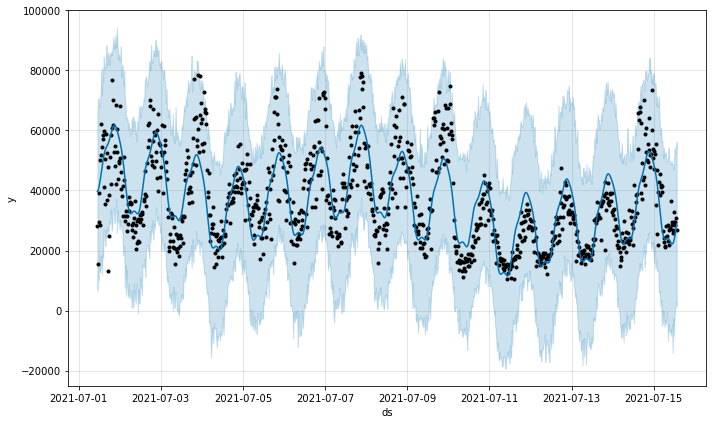

In [31]:
pred = fit_prophet(kafka, 'ap-wifi-rssi-stats-production|production', '20T')

In [32]:
anomalies = detect_anomalies(pred)
anomalies

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
0,2021-07-01 11:00:00,45456.283820,39699.036919,6713.044435,66024.968367,28325.081838,0,0.0
1,2021-07-01 11:20:00,45438.970013,39989.687122,12830.700333,69077.392580,15400.716116,0,0.0
2,2021-07-01 11:40:00,45421.656204,40531.928259,9979.392500,70814.609634,39266.442827,0,0.0
3,2021-07-01 12:00:00,45404.342394,41325.394075,18424.453019,67568.901527,29638.302249,0,0.0
4,2021-07-01 12:20:00,45387.028584,42348.420129,13272.816763,67903.362954,28496.187833,0,0.0
...,...,...,...,...,...,...,...,...
1011,2021-07-15 12:00:00,27952.021723,23873.073405,-3685.267069,53040.728731,29631.767794,0,0.0
1012,2021-07-15 12:20:00,27934.707913,24896.099458,-57.908226,54460.241002,29622.154203,0,0.0
1013,2021-07-15 12:40:00,27917.394103,26107.833005,905.031728,52913.396894,28640.099729,0,0.0
1014,2021-07-15 13:00:00,27900.080293,27452.433694,3248.062274,52512.409839,30748.710198,0,0.0


In [33]:
anomalies[anomalies.anomaly!=0]

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
19,2021-07-01 17:20:00,45127.321428,55712.377184,25086.868341,86059.886981,13148.023574,-1,0.908033
21,2021-07-01 18:00:00,45092.693807,56842.637333,29890.666923,81828.815531,24837.321195,-1,0.203458
179,2021-07-03 22:40:00,42357.111798,49649.115527,18345.662788,74775.506099,78061.604776,1,0.042096
187,2021-07-04 01:20:00,42218.601317,42115.427925,11973.575470,67883.356163,72836.434214,1,0.068003
948,2021-07-14 15:00:00,29042.791765,40163.843017,11632.529374,64194.956699,65802.067208,1,0.024423


In [34]:
plot_anomalies(anomalies)

alt.LayerChart(...)

## Synthetic Data/Anomalies

In [35]:
def random_point_anom(df, metric, quantity):
    index = list(np.random.choice(df['date'],size=quantity))
    print('Indices being changed:' + str(index))
    print('\n')
    multiplier = random.sample(range(1000, 1500), quantity)
    print('Multipliers applied to indices:' + str(multiplier))
    df = df[['date',metric]]
    df.set_index('date', inplace=True)
    for i in range(quantity):
        df.loc[index[i],metric] = df.loc[index[i],metric]*multiplier[i]
    return df.reset_index()

In [36]:
def cont_anoms(df, metric, negative=False):
    high = round(len(df)/(random.sample(range(100, 200),1))[0])
    low = round(len(df)/(random.sample(range(500, 700),1))[0])
    new_anoms = (df['date'][low:high]).tolist()
    df = df[['date',metric]]
    df.set_index('date', inplace=True)
    if negative == True:
        for i in new_anoms:
            df.loc[i,metric] = df.loc[i,metric]*-(1500)
    else:
        for i in new_anoms:
            df.loc[i,metric] = df.loc[i,metric]*1500
    return df.reset_index()   

In [37]:
def saturation_anoms(df, metric):
    high = round(len(df)/(random.sample(range(3, 5),1))[0])
    low = round(len(df)/(random.sample(range(1000, 1500),1))[0])
    new_anoms = (df['date'][low:high]).tolist()
    #print(new_anoms)
    df = df[['date',metric]]
    df.set_index('date', inplace=True)
    hold = df.loc[new_anoms[low],metric]
    for i in new_anoms:
            df.loc[i,metric] = hold
    return df.reset_index()   

In [38]:
kube = random_point_anom(papi,'papi|aws|production|kube-probe',7)

Indices being changed:['2021-07-05 13:42:00', '2021-07-07 18:11:00', '2021-07-05 16:41:00', '2021-07-06 14:35:00', '2021-07-07 20:03:00', '2021-07-03 08:38:00', '2021-07-05 13:42:00']


Multipliers applied to indices:[1152, 1051, 1169, 1205, 1498, 1398, 1259]


INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


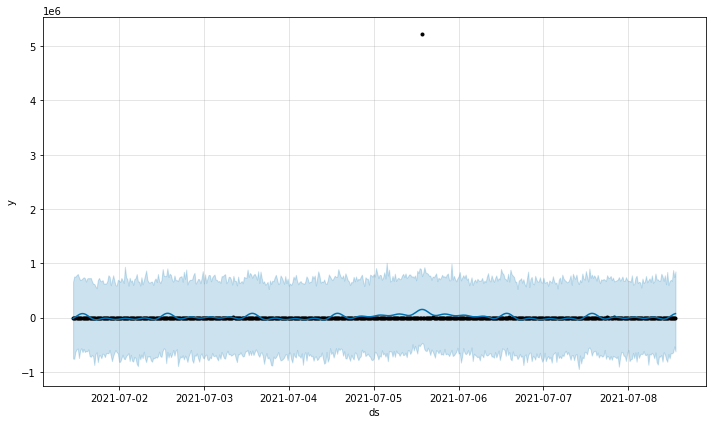

In [39]:
kubepred=fit_prophet(kube, 'papi|aws|production|kube-probe', '20T')

In [40]:
kubepred = detect_anomalies(kubepred)
kubepred[kubepred.anomaly!=0]

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
296,2021-07-05 13:40:00,10060.674279,151783.25733,-463066.154711,765019.795798,5221393.15,1,0.853484


In [41]:
plot_anomalies(kubepred)

alt.LayerChart(...)

INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


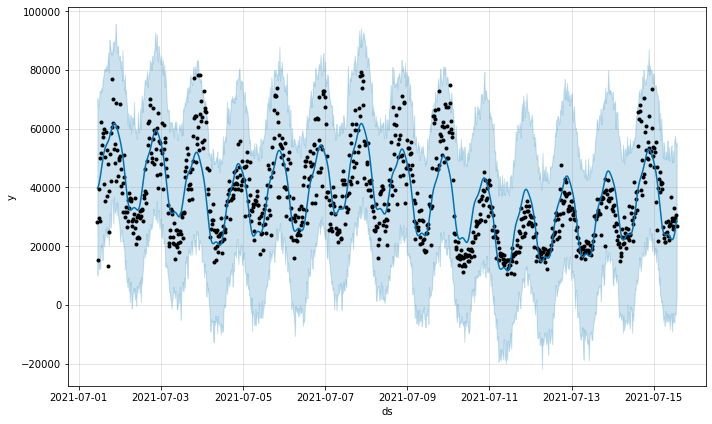

In [42]:
pred = fit_prophet(kafka, 'ap-wifi-rssi-stats-production|production', '20T')

INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


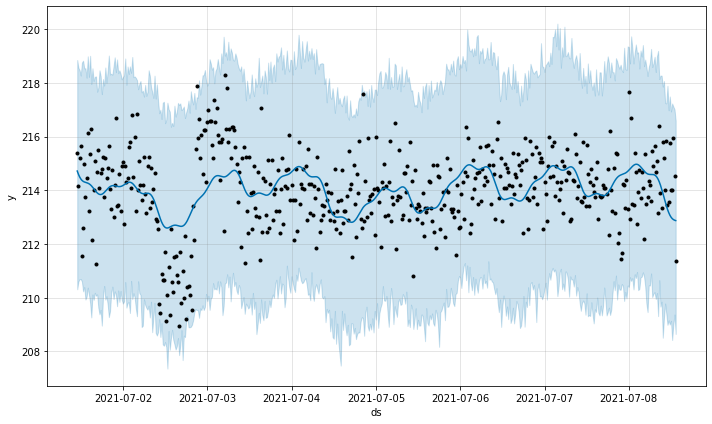

In [43]:
pred = fit_prophet(papi, 'papi-internal|aws|production|es-ap-stats-v2', '20T')

In [44]:
anomalies = detect_anomalies(pred)

In [45]:
plot_anomalies(anomalies)

alt.LayerChart(...)

## AP Trend

In [46]:
def get_data_frame(client, program, start, stop, resolution=None):
    """Executes the given program across the given time range (expressed in
    millisecond timestamps since Epoch), and returns a Pandas DataFrame
    containing the results, indexed by output timestamp.
    If the program contains multiple publish() calls, their outputs are merged
    into the returned DataFrame."""
    data = {}
    metadata = {}
    c = client.execute(program, start=start, stop=stop, resolution=resolution)
    for msg in c.stream():
        if isinstance(msg, messages.DataMessage):
            if msg.logical_timestamp_ms in data:
                data[msg.logical_timestamp_ms].update(msg.data)
            else:
                data[msg.logical_timestamp_ms] = msg.data
        elif isinstance(msg, messages.MetadataMessage):
            metadata[msg.tsid] = msg.properties

    df = pd.DataFrame.from_dict(data, orient='index')
    df.metadata = metadata
    columns_names={}
    # renaming columns with topics
    for key in df.metadata:
        if ('provider' in metadata[key]) and ('env' in metadata[key]) and ('topic' in metadata[key]):
            columns_names[key] = df.metadata[key]['topic']+'|'+df.metadata[key]['provider']+'|'+df.metadata[key]['env']
        else:
            columns_names[key] = df.metadata[key]['topic']+'|'+df.metadata[key]['env']
    df = df.rename(columns=columns_names)
    df = df.dropna(axis=1,how='all')
    reset_df = df.reset_index()
    reset_df['date']=pd.to_datetime(reset_df['index'],unit='ms')
    reset_df = reset_df.drop(columns=['index'])
    reset_df = reset_df.set_index('date')
    return reset_df.loc[:, reset_df.sum().astype(bool)]

In [47]:
# ap_start = 1621000800000
# ap_end = 1627826400000
# ap_flow = "data('ap.tcp.count', filter=filter('app', 'terminator') and filter('provider', 'aws') and filter('env', 'production')).sum().publish(label='B')"

In [48]:
# get_ap_data_frame(signalflow_client,ap_flow, ap_start,ap_end)

In [49]:
ap_trend = pd.read_csv('data/ap_trend.csv')

In [50]:
df = ap_trend
df['date'] = pd.to_datetime(df.date)
df = df.set_index('date')
df = df.asfreq(freq='T')
df_resample = df.resample('1D').sum()
df_resample.reset_index(inplace=True)

In [51]:
max(df['terminator|aws|production'])

317307.0

In [52]:
sm_ExponentialSmoothing(ap_trend, 'terminator|aws|production', '20T')

/Users/vwong/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [53]:
ap_trend2=pd.read_csv('data/ap_trend2.csv')

In [54]:
sm_ExponentialSmoothing(ap_trend2, 'terminator|aws|production', '20T')

/Users/vwong/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [55]:
df = ap_trend2
df['date'] = pd.to_datetime(df.date)
df = df.set_index('date')
df = df.asfreq(freq='T')
ok = df.resample('1D').sum()
max(ok['terminator|aws|production'])

43843610.0

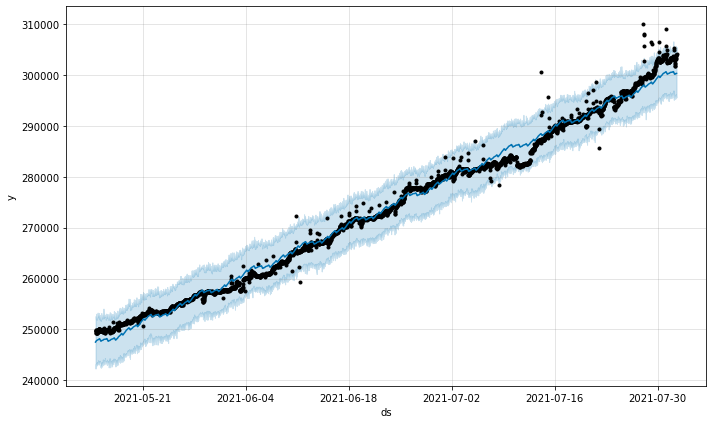

In [56]:
ap_pred = fit_prophet(ap_trend, 'terminator|aws|production', '30T')

In [57]:
ap_anom = detect_anomalies(ap_pred)

In [58]:
plot_anomalies(ap_anom)

alt.LayerChart(...)

In [59]:
ap_trend3=pd.read_csv('data/ap_trend_A.csv')

In [60]:
sm_ExponentialSmoothing(ap_trend3, 'aws|production','20T')

/Users/vwong/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



## Lag

In [61]:
lag=pd.read_csv('data/lag.csv')

In [62]:
lag

,date,dizzy_updater|production
0,2021-07-29 11:00:00,2802.177705
1,2021-07-29 11:05:00,943.106803
2,2021-07-29 11:10:00,843.163463
3,2021-07-29 11:15:00,896.473547
4,2021-07-29 11:20:00,759.819740
...,...,...
2000,2021-08-05 09:40:00,222044.592664
2001,2021-08-05 09:45:00,303262.265718
2002,2021-08-05 09:50:00,198089.514641
2003,2021-08-05 09:55:00,2698.285061


In [63]:
sm_ExponentialSmoothing(lag,'dizzy_updater|production', '20T')

/Users/vwong/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


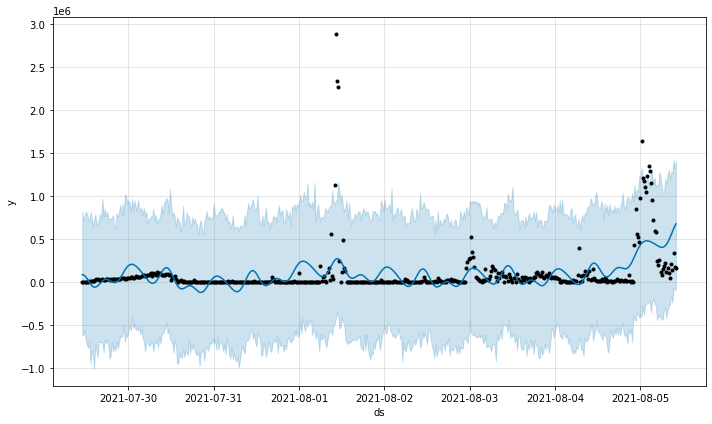

In [64]:
pred=fit_prophet(lag,'dizzy_updater|production', '20T')

In [65]:
anom = detect_anomalies(pred)

In [66]:
plot_anomalies(anom)

alt.LayerChart(...)

## SLE Roaming

In [67]:
# roam_flow = "data('consumer_group.lag.time', filter=filter('provider', 'aws') and filter('env', 'eu') and filter('data_source', 'flink-lag') and filter('app', ' sle_roaming_v2_impact_dist_by_site_c')).sum().publish(label='A')"
# end_roam = 1628168400000
# start_roam = 1627563600000

In [68]:
sleroam = pd.read_csv('data/sleroam.csv')

In [69]:
sm_ExponentialSmoothing(sleroam,' sle_roaming_v2_impact_dist_by_site_c|aws|eu|flink-lag', '20T')

/Users/vwong/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


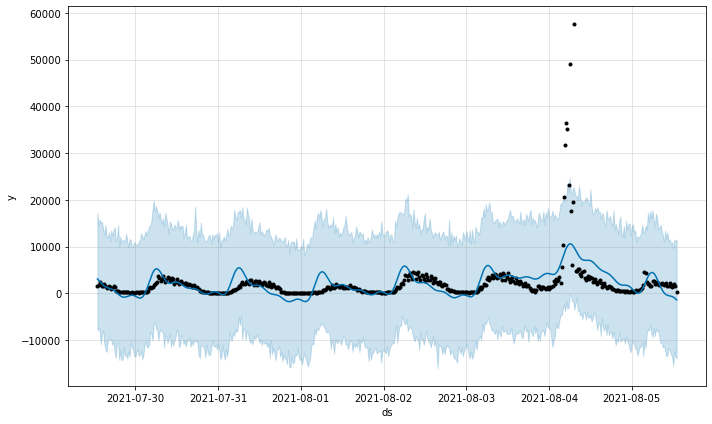

In [70]:
roampred = fit_prophet(sleroam,' sle_roaming_v2_impact_dist_by_site_c|aws|eu|flink-lag', '20T')

In [71]:
roamanoms = detect_anomalies(roampred)
roamanoms

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
0,2021-07-29 13:00:00,4315.105834,3066.161954,-7938.717275,17206.075224,1555.523816,0,0.0
1,2021-07-29 13:20:00,4306.196642,2794.549485,-7314.130559,14526.784836,1855.201410,0,0.0
2,2021-07-29 13:40:00,4297.287450,2510.044328,-8253.583394,15802.697069,2311.704968,0,0.0
3,2021-07-29 14:00:00,4288.378257,2228.738183,-10923.440762,14982.938796,1956.667132,0,0.0
4,2021-07-29 14:20:00,4279.469064,1965.645669,-8634.390784,15255.925408,1518.642935,0,0.0
...,...,...,...,...,...,...,...,...
500,2021-08-05 11:40:00,-139.490868,-700.827125,-13353.048023,10963.847395,1377.397444,0,0.0
501,2021-08-05 12:00:00,-148.400061,-815.920457,-15493.460916,9579.587609,1656.745947,0,0.0
502,2021-08-05 12:20:00,-157.309255,-975.498352,-12299.883003,11408.194275,1936.668836,0,0.0
503,2021-08-05 12:40:00,-166.218448,-1180.215676,-13640.278314,11083.608637,1504.815552,0,0.0


In [72]:
plot_anomalies(roamanoms)

alt.LayerChart(...)